In [ ]:




import requests

url = "https://eonet.gsfc.nasa.gov/api/v3/events"
response = requests.get(url)
data = response.json()



events = data["events"]



import pandas as pd

rows = []

for event in events:
    for g in event["geometry"]:
        rows.append({
            "event": event["title"],
            "date": g["date"],
            "magnitude": g.get("magnitudeValue"),
            "lat": g["coordinates"][1],
            "lon": g["coordinates"][0]
        })

df = pd.DataFrame(rows)
#save in a folder
df.to_csv("Nasa_Event_data.csv", index=False)
print(df.head(30))



                                                event                  date  \
0                               Super Typhoon Sinlaku  2026-04-09T18:00:00Z   
1                               Super Typhoon Sinlaku  2026-04-10T00:00:00Z   
2                               Super Typhoon Sinlaku  2026-04-10T06:00:00Z   
3                               Super Typhoon Sinlaku  2026-04-10T12:00:00Z   
4                               Super Typhoon Sinlaku  2026-04-10T18:00:00Z   
5                               Super Typhoon Sinlaku  2026-04-11T00:00:00Z   
6                               Super Typhoon Sinlaku  2026-04-11T06:00:00Z   
7                               Super Typhoon Sinlaku  2026-04-11T12:00:00Z   
8                               Super Typhoon Sinlaku  2026-04-11T18:00:00Z   
9                               Super Typhoon Sinlaku  2026-04-12T00:00:00Z   
10                              Super Typhoon Sinlaku  2026-04-12T06:00:00Z   
11  rx-Northern Scupp EWO Prescribed Fire, Waukesh..

In [ ]:
df.shape

(7243, 5)

In [ ]:
df.columns

Index(['event', 'date', 'magnitude', 'lat', 'lon'], dtype='object')

In [ ]:
df["event"].value_counts()

,count
event,
Iceberg A23A,72
Iceberg B15AB,61
Iceberg A74A,54
Iceberg A76C,49
Iceberg D32,48
...,...
Wildfire in Australia 1023374,1
Wildfire in Australia 1023358,1
"APQ NC Range Rx 0115 Wildfire, Polk, Florida",1


In [ ]:
print(df.isnull().sum())

event           0
date            0
magnitude    3922
lat             0
lon             0
dtype: int64


,event,date,magnitude,lat,lon,event_type
7238,Iceberg B09B,2011-08-30 00:00:00+00:00,NaN,-66.3660,143.3638,Iceberg
7239,Iceberg B09B,2013-04-08 00:00:00+00:00,NaN,-66.7354,142.6649,Iceberg
7240,Iceberg B09B,2018-01-12 00:00:00+00:00,NaN,-66.3700,143.3900,Iceberg
7241,Iceberg C21B,2011-08-30 00:00:00+00:00,NaN,-64.9955,96.1800,Iceberg
7242,"Fuego Volcano, Guatemala",2002-01-04 00:00:00+00:00,NaN,14.4730,-90.8800,Fuego


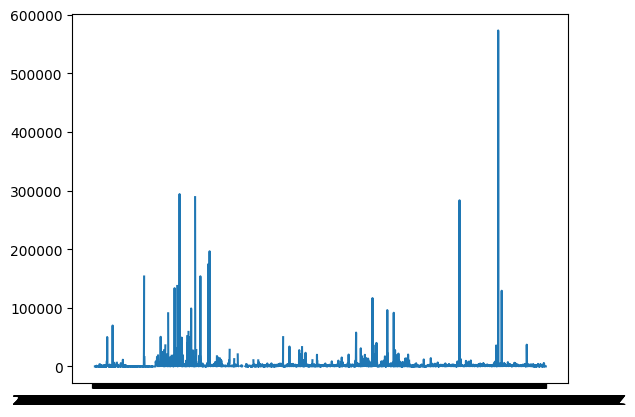

In [ ]:
import matplotlib.pyplot as plt

df_sorted = df.sort_values('date')

plt.plot(df_sorted['date'], df_sorted['magnitude'])
plt.show()

In [ ]:
wildfire_df = df[df['event'].str.contains(r'\bWildfire\b', case=False, na=False)]

print(wildfire_df)

wildfire_df.to_csv("wildfire_df.csv", index=False)

                                                  event                  date  \
12                   HARRISON Wildfire, Osage, Oklahoma  2026-04-09T13:08:00Z   
13                        JOY Wildfire, Osage, Oklahoma  2026-04-09T11:29:00Z   
15      Rosindale Road Wildfire, Bladen, North Carolina  2026-04-09T10:20:00Z   
17                     HUGHEY Wildfire, Osage, Oklahoma  2026-04-09T09:15:00Z   
21                HC 1 Wildfire, San Miguel, New Mexico  2026-04-08T19:31:00Z   
...                                                 ...                   ...   
6799               Pilot Wildfire, Humboldt, California  2023-08-15T18:41:00Z   
6800            Diamond Wildfire, Del Norte, California  2023-08-15T12:55:00Z   
6801     Black Feather Wildfire, Rio Arriba, New Mexico  2023-08-05T17:59:00Z   
6803  Cocke County Mill Creek Road Fire Wildfire, Co...  2023-03-15T10:00:00Z   
6880                   Fish Wildfire, Greenlee, Arizona  2022-06-10T18:12:00Z   

      magnitude        lat 

In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load your saved wildfire data
Wildfire_df = pd.read_csv("wildfire_df.csv")

# Create map (global view)
m = folium.Map(location=[20, 0], zoom_start=2)

# Add title
title_html = """
<h3 align="center" style="font-size:20px"><b>Wildfire Events Map</b></h3>
"""
m.get_root().html.add_child(folium.Element(title_html))

# Use clustering
cluster = MarkerCluster().add_to(m)
for _, row in Wildfire_df.iterrows():
    folium.Marker(
        location=[row['lat'], row['lon']],
        popup=f"{row['event']} | Mag: {row['magnitude']}"
    ).add_to(cluster)

# Save map
m.save("wildfire_map.html")

m

In [ ]:
Typhoon_df = df[df['event'].str.contains(r'\bTyphoon|Severe Typhoon\b', case=False, na=False)]
print(Typhoon_df)
Typhoon_df.to_csv("Typhoon_df.csv", index=False)

                    event                  date  magnitude   lat    lon
0   Super Typhoon Sinlaku  2026-04-09T18:00:00Z       35.0   8.3  151.5
1   Super Typhoon Sinlaku  2026-04-10T00:00:00Z       40.0   8.2  151.2
2   Super Typhoon Sinlaku  2026-04-10T06:00:00Z       45.0   8.2  151.0
3   Super Typhoon Sinlaku  2026-04-10T12:00:00Z       55.0   8.1  150.9
4   Super Typhoon Sinlaku  2026-04-10T18:00:00Z       60.0   8.0  151.0
5   Super Typhoon Sinlaku  2026-04-11T00:00:00Z       75.0   8.5  151.5
6   Super Typhoon Sinlaku  2026-04-11T06:00:00Z       80.0   8.8  151.4
7   Super Typhoon Sinlaku  2026-04-11T12:00:00Z       85.0   9.0  151.1
8   Super Typhoon Sinlaku  2026-04-11T18:00:00Z       95.0   9.3  151.5
9   Super Typhoon Sinlaku  2026-04-12T00:00:00Z      110.0   9.9  151.2
10  Super Typhoon Sinlaku  2026-04-12T06:00:00Z      130.0  10.3  150.6


In [ ]:
Typhoon_df.shape

(11, 5)

# Typhoon

In [ ]:
import pandas as pd
import folium

# Load Typhoon data
Typhoon_df = pd.read_csv("Typhoon_df.csv")

# Convert date (important for sorting)
Typhoon_df['date'] = pd.to_datetime(Typhoon_df['date'], errors='coerce')

# Sort for path plotting
Typhoon_df = Typhoon_df.sort_values('date')

# Create map (Pacific region focus)
m = folium.Map(location=[10, 130], zoom_start=4)

# Add title
title_html = """
<h3 align="center" style="font-size:20px"><b>Typhoon Events Map</b></h3>
"""
m.get_root().html.add_child(folium.Element(title_html))

# Plot points
for _, row in Typhoon_df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=max(4, row['magnitude']/20),
        color='blue',
        fill=True,
        fill_opacity=0.6,
        popup=f"{row['event']} | Wind: {row['magnitude']} | {row['date']}"
    ).add_to(m)

# Draw path (trajectory)
points = Typhoon_df[['lat', 'lon']].values.tolist()
folium.PolyLine(points, color="blue", weight=3).add_to(m)

# Save map
m.save("typhoon_map.html")

m

In [ ]:
Cyclone_df = df[df['event'].str.contains(r'\bCyclone\b', case=False, na=False)]

print(Cyclone_df.head(7))

Cyclone_df.to_csv("Cyclone_df.csv", index=False)

                      event                  date  magnitude   lat    lon
64  Tropical Cyclone Vaianu  2026-04-05T00:00:00Z       40.0 -13.8  171.8
65  Tropical Cyclone Vaianu  2026-04-05T06:00:00Z       55.0 -14.5  172.3
66  Tropical Cyclone Vaianu  2026-04-05T12:00:00Z       60.0 -14.9  172.4
67  Tropical Cyclone Vaianu  2026-04-05T18:00:00Z       75.0 -15.1  172.6
68  Tropical Cyclone Vaianu  2026-04-06T00:00:00Z       80.0 -15.7  173.1
69  Tropical Cyclone Vaianu  2026-04-06T06:00:00Z       90.0 -16.1  173.6
70  Tropical Cyclone Vaianu  2026-04-06T12:00:00Z       95.0 -16.5  173.8


In [ ]:
Cyclone_df.shape

(47, 5)

In [ ]:

iceberg_df = df[df['event'].str.contains(r'\bIceberg\b', case=False, na=False)]

print(iceberg_df)

iceberg_df.to_csv("Iceberg_events.csv", index=False)

             event                  date  magnitude      lat       lon
644   Iceberg D15C  2026-02-13T00:00:00Z      56.17 -66.8400   81.0500
919   Iceberg C18C  2025-10-31T00:00:00Z      25.93 -66.8900   65.5800
920   Iceberg C18C  2025-11-14T00:00:00Z      20.00 -66.7300   63.9000
921   Iceberg C18C  2025-11-21T00:00:00Z      20.00 -66.6300   62.4400
922   Iceberg C18C  2025-11-28T00:00:00Z      20.00 -66.7500   60.5100
...            ...                   ...        ...      ...       ...
7237   Iceberg C15  2017-12-01T00:00:00Z        NaN -66.2500  143.3600
7238  Iceberg B09B  2011-08-30T00:00:00Z        NaN -66.3660  143.3638
7239  Iceberg B09B  2013-04-08T00:00:00Z        NaN -66.7354  142.6649
7240  Iceberg B09B  2018-01-12T00:00:00Z        NaN -66.3700  143.3900
7241  Iceberg C21B  2011-08-30T00:00:00Z        NaN -64.9955   96.1800

[710 rows x 5 columns]


In [ ]:
iceberg_df_A = df[
    df['event'].str.contains(r'\bIceberg\s+[A]', case=False, na=False)
]

print(iceberg_df_A)

# Save file
iceberg_df_A.to_csv("Iceberg_A_events.csv", index=False)

             event                  date  magnitude    lat    lon
2027   Iceberg A85  2025-02-21T00:00:00Z       30.0 -77.51 -48.54
2028   Iceberg A85  2025-03-06T00:00:00Z       30.0 -76.96 -49.40
2029   Iceberg A85  2025-03-13T00:00:00Z       30.0 -76.66 -51.03
2030   Iceberg A85  2025-03-27T00:00:00Z       30.0 -76.16 -53.15
2031   Iceberg A85  2025-04-11T00:00:00Z       30.0 -75.80 -54.47
...            ...                   ...        ...    ...    ...
7189  Iceberg A23A  2026-02-13T00:00:00Z      572.0 -48.95 -40.64
7190  Iceberg A23A  2026-02-19T00:00:00Z      572.0 -48.02 -34.61
7191  Iceberg A23A  2026-02-26T00:00:00Z      168.0 -47.17 -31.83
7192  Iceberg A23A  2026-03-06T00:00:00Z       63.0 -48.60 -33.43
7193  Iceberg A23A  2026-03-13T00:00:00Z       63.0 -48.95 -31.79

[265 rows x 5 columns]


In [ ]:
iceberg_df_C = df[
    df['event'].str.contains(r'\bIceberg\s+[C]', case=False, na=False)
]

print(iceberg_df_C)

# Save file
iceberg_df_C.to_csv("Iceberg_C_events.csv", index=False)

             event                  date  magnitude      lat       lon
919   Iceberg C18C  2025-10-31T00:00:00Z      25.93 -66.8900   65.5800
920   Iceberg C18C  2025-11-14T00:00:00Z      20.00 -66.7300   63.9000
921   Iceberg C18C  2025-11-21T00:00:00Z      20.00 -66.6300   62.4400
922   Iceberg C18C  2025-11-28T00:00:00Z      20.00 -66.7500   60.5100
923   Iceberg C18C  2025-12-05T00:00:00Z      20.00 -66.4300   58.7600
...            ...                   ...        ...      ...       ...
7234   Iceberg C15  2015-01-08T00:00:00Z        NaN -66.8472  145.4999
7235   Iceberg C15  2015-02-06T00:00:00Z        NaN -66.6613  144.2684
7236   Iceberg C15  2015-02-18T00:00:00Z        NaN -66.5038  143.1912
7237   Iceberg C15  2017-12-01T00:00:00Z        NaN -66.2500  143.3600
7241  Iceberg C21B  2011-08-30T00:00:00Z        NaN -64.9955   96.1800

[87 rows x 5 columns]


In [ ]:
iceberg_df_D = df[
    df['event'].str.contains(r'\bIceberg\s+[D]', case=False, na=False)
]

print(iceberg_df_D)

# Save file
iceberg_df_D.to_csv("Iceberg_D_events.csv", index=False)

             event                  date  magnitude    lat      lon
644   Iceberg D15C  2026-02-13T00:00:00Z      56.17 -66.84  81.0500
2047   Iceberg D37  2025-02-21T00:00:00Z     210.00 -69.22  36.3400
6641  Iceberg D33C  2024-04-19T00:00:00Z        NaN -75.52 -20.0200
6642  Iceberg D33C  2024-12-13T00:00:00Z     105.00 -71.34 -53.9600
6643  Iceberg D33C  2025-01-10T00:00:00Z     105.00 -70.63 -55.7300
...            ...                   ...        ...    ...      ...
6877   Iceberg D32  2026-04-10T00:00:00Z      54.00 -66.36 -47.6600
7054   Iceberg D23  2019-03-13T00:00:00Z        NaN -69.43  74.6500
7119  Iceberg D15B  2016-02-01T00:00:00Z        NaN -67.00  81.6330
7120  Iceberg D15B  2017-12-01T00:00:00Z        NaN -67.08  81.7600
7121  Iceberg D15A  2016-01-31T00:00:00Z        NaN -66.70  81.9167

[171 rows x 5 columns]


In [ ]:
iceberg_df_B = df[
    df['event'].str.contains(r'\bIceberg\s+[B]', case=False, na=False)
]

print(iceberg_df_B)

# Save file
iceberg_df_B.to_csv("Iceberg_B_events.csv", index=False)

             event                  date  magnitude      lat       lon
1176  Iceberg B22H  2025-07-11T12:00:00Z      71.16 -73.7100 -168.7800
1177  Iceberg B22H  2025-07-31T00:00:00Z     133.00 -73.2200 -169.1300
1178  Iceberg B22H  2025-08-21T00:00:00Z     133.00 -72.4600 -170.7700
1179  Iceberg B22H  2025-09-04T00:00:00Z     133.00 -72.0500 -172.2400
1180  Iceberg B22H  2025-09-18T00:00:00Z     133.00 -71.7800 -173.8600
...            ...                   ...        ...      ...       ...
7230  Iceberg B22A  2025-11-28T00:00:00Z     725.00 -70.2500 -178.5700
7231  Iceberg B22A  2026-03-26T00:00:00Z     725.00 -70.7000 -178.6000
7238  Iceberg B09B  2011-08-30T00:00:00Z        NaN -66.3660  143.3638
7239  Iceberg B09B  2013-04-08T00:00:00Z        NaN -66.7354  142.6649
7240  Iceberg B09B  2018-01-12T00:00:00Z        NaN -66.3700  143.3900

[187 rows x 5 columns]


In [ ]:
import pandas as pd
import folium

# Load data
Iceberg_df_B = pd.read_csv("Iceberg_B_events.csv")

# Center map using mean location
m = folium.Map(
    location=[Iceberg_df_B['lat'].mean(), Iceberg_df_B['lon'].mean()],
    zoom_start=4
)

# Plot simple markers (no popup, no styling)
for _, row in Iceberg_df_B.iterrows():
    folium.Marker(
        location=[row['lat'], row['lon']]
    ).add_to(m)

# Save map
m.save("iceberg_B_map.html")

m

In [ ]:

hurricane_df = df[df['event'].str.contains(r'Hurricane', case=False, na=False)]

print(hurricane_df)

hurricane_df.to_csv("Hurricane_events.csv", index=False)

                                                  event  \
1951  RX 97 old growth hurricane Wildfire, Montgomer...   
5811    HURRICANE Wildfire, San Luis Obispo, California   

                          date  magnitude        lat         lon event_type  
1951 2025-02-27 11:09:00+00:00     3727.0  34.416667  -93.913333         RX  
5811 2024-07-13 11:26:00+00:00    12703.0  35.199333 -119.695667  HURRICANE  


In [ ]:
flood_df = df[df['event'].str.contains(r'\bFlood\b', case=False, na=False)]

print(flood_df)


                                     event                      date  \
3026  GOR - Flood Wildfire, Pinal, Arizona 2024-10-09 20:36:00+00:00   

      magnitude        lat       lon event_type  
3026     1000.0  32.601167 -110.9815        GOR  


In [ ]:


volcano_df = df[df['event'].str.contains(r'\bVolcano\b', case=False, na=False)]

print(volcano_df)

volcano_df.to_csv("volcano_events.csv", index=False)

                                               event                  date  \
848                          Ambrym Volcano, Vanuatu  2026-01-08T00:00:00Z   
849                       Mayon Volcano, Philippines  2026-01-07T00:00:00Z   
856                        Masaya Volcano, Nicaragua  2026-01-02T00:00:00Z   
858                          Sabancaya Volcano, Peru  2025-12-29T00:00:00Z   
880                    Nyamulagira Volcano, DR Congo  2025-12-07T00:00:00Z   
885                           Ambae Volcano, Vanuatu  2025-12-03T00:00:00Z   
887                         Puracé Volcano, Colombia  2025-12-02T00:00:00Z   
889                  Manam Volcano, Papua New Guinea  2025-11-30T00:00:00Z   
890                     Barren Island Volcano, India  2025-11-29T00:00:00Z   
891                    Hayli Gubbi Volcano, Ethiopia  2025-11-23T12:23:00Z   
905                  Planchón-Peteroa Volcano, Chile  2025-11-13T00:00:00Z   
967                     Kanlaon Volcano, Philippines  2025-09-10

In [ ]:
volcano_df.shape

(44, 5)

In [ ]:
import pandas as pd
import folium

# Load volcano data
Volcano_df = pd.read_csv("volcano_events.csv")

# Safety check (optional)
Volcano_df = Volcano_df.dropna(subset=['lat', 'lon'])

# Center map on data
m = folium.Map(
    location=[Volcano_df['lat'].mean(), Volcano_df['lon'].mean()],
    zoom_start=4
)

# Plot dots
for _, row in Volcano_df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=4,
        color='red',
        fill=True,
        fill_opacity=0.8
    ).add_to(m)

# Save map
m.save("volcano_map.html")

m

In [ ]:
complex_df = df[df['event'].str.contains(r'Complex', case=False, na=False)]

print(complex_df)

complex_df.to_csv("complex_events.csv", index=False)

                                                  event                  date  \
440   LIRI NE Complex RX Prescribed Fire, Cherokee, ...  2026-03-01T16:10:00Z   
974        Moon Complex Incident Complex, Curry, Oregon  2025-09-04T19:25:00Z   
977   Green Rattle Complex Incident Complex, Bonner,...  2025-09-04T14:41:00Z   
984   TCU SEPTEMBER LIGHTNING COMPLEX Incident Compl...  2025-09-02T18:36:00Z   
995   SWIFT COMPLEX Incident Complex, Trinity, Calif...  2025-09-01T16:02:00Z   
1219  Goldrun Complex Incident Complex, Northwest Ar...  2025-07-09T15:50:00Z   
1224  Grizzly Complex Incident Complex, Jackson, Oregon  2025-07-08T22:31:00Z   
1225  Orleans Complex Incident Complex, Siskiyou, Ca...  2025-07-08T20:33:00Z   
1244  MARBLE COMPLEX Incident Complex, Siskiyou, Cal...  2025-07-03T14:22:00Z   
1278  Nenana Ridge Complex Incident Complex, Fairban...  2025-06-22T00:19:00Z   
1280  Roundabout Complex Incident Complex, Yukon-Koy...  2025-06-21T20:03:00Z   
1291  Ptarmigan Complex Inci

In [ ]:

print(complex_df.shape)



(28, 5)


In [ ]:




import requests

url = "https://eonet.gsfc.nasa.gov/api/v3/events"
response = requests.get(url)
data = response.json()



events = data["events"]



import pandas as pd

rows = []

for event in events:
    for g in event["geometry"]:
        rows.append({
            "event": event["title"],
            "date": g["date"],
            "magnitude": g.get("magnitudeValue"),
            "lat": g["coordinates"][1],
            "lon": g["coordinates"][0]
        })

df = pd.DataFrame(rows)
#save in a folder
df.to_csv("Nasa_Event_data.csv", index=False)
print(df.head(30))



                                                event                  date  \
0           rx-66 Prescribed Fire, Burnett, Wisconsin  2026-04-23T14:23:00Z   
1              Bauman Wildfire, Jackson, South Dakota  2026-04-23T12:13:00Z   
2   Baldwin Fuels 6 RX Prescribed Fire, Lake, Mich...  2026-04-23T11:03:00Z   
3                   Peterson Wildfire, Holt, Nebraska  2026-04-23T09:06:00Z   
4                  Andrews Wildfire, Cherry, Nebraska  2026-04-22T21:43:00Z   
5                  Hammer Wildfire, El Paso, Colorado  2026-04-22T21:07:00Z   
6         Taber Rec Wildfire, Bon Homme, South Dakota  2026-04-22T20:05:00Z   
7                  Pressey Wildfire, Cherry, Nebraska  2026-04-22T17:15:00Z   
8               Lone Pine Wildfire, Becker, Minnesota  2026-04-22T13:40:00Z   
9   Wells Rd Unit 1 RX Prescribed Fire, Iosco, Mic...  2026-04-22T08:34:00Z   
10                  COW CREEK Wildfire, Levy, Florida  2026-04-21T23:15:00Z   
11          rx-73 Prescribed Fire, Burnett, Wisconsi

In [ ]:
df.head()

,event,date,magnitude,lat,lon
0,"rx-66 Prescribed Fire, Burnett, Wisconsin",2026-04-23T14:23:00Z,1490.3,45.850859,-92.653518
1,"Bauman Wildfire, Jackson, South Dakota",2026-04-23T12:13:00Z,1000.0,43.631000,-101.395083
2,"Baldwin Fuels 6 RX Prescribed Fire, Lake, Mich...",2026-04-23T11:03:00Z,658.0,43.882750,-85.896883
3,"Peterson Wildfire, Holt, Nebraska",2026-04-23T09:06:00Z,1000.0,42.124830,-99.042730
4,"Andrews Wildfire, Cherry, Nebraska",2026-04-22T21:43:00Z,2500.0,42.763583,-101.004000


In [ ]:
df = pd.read_csv("Nasa_Event_data.csv")
df.head()

,event,date,magnitude,lat,lon
0,"rx-66 Prescribed Fire, Burnett, Wisconsin",2026-04-23T14:23:00Z,1490.3,45.850859,-92.653518
1,"Bauman Wildfire, Jackson, South Dakota",2026-04-23T12:13:00Z,1000.0,43.631000,-101.395083
2,"Baldwin Fuels 6 RX Prescribed Fire, Lake, Mich...",2026-04-23T11:03:00Z,658.0,43.882750,-85.896883
3,"Peterson Wildfire, Holt, Nebraska",2026-04-23T09:06:00Z,1000.0,42.124830,-99.042730
4,"Andrews Wildfire, Cherry, Nebraska",2026-04-22T21:43:00Z,2500.0,42.763583,-101.004000


In [ ]:
df.shape

(7091, 5)

In [ ]:

import pandas as pd
import numpy as np

# ── 1. Date ───────────────────────────────────────────────────
df['date'] = pd.to_datetime(df['date'], errors='coerce', utc=True)

# ── 2. Normalise column names (mirrors Prepaire col_map) ─────
col_map = {}
for col in df.columns:
    lower = col.lower().strip()
    if lower in ('latitude', 'lat'):        col_map[col] = 'lat'
    elif lower in ('longitude', 'lon', 'long'): col_map[col] = 'lon'
    elif lower in ('event', 'event_name', 'title'): col_map[col] = 'event'
    elif lower in ('date', 'datetime', 'timestamp', 'time'): col_map[col] = 'date'
    elif lower in ('magnitude', 'mag', 'size', 'area'): col_map[col] = 'magnitude'
df = df.rename(columns=col_map)

# ── 3. Clean lat / lon ────────────────────────────────────────
df['lat'] = pd.to_numeric(df['lat'], errors='coerce')
df['lon'] = pd.to_numeric(df['lon'], errors='coerce')
df = df.dropna(subset=['lat', 'lon', 'date']).copy()
df = df[(df['lat'].between(-90, 90)) & (df['lon'].between(-180, 180))].copy()

# ── 4. Strip timezone ─────────────────────────────────────────
df['date'] = df['date'].dt.tz_convert(None)

# ── 5. Magnitude → intensity (log-scale + per-type median fill)
def _log_scale_intensity(series: pd.Series) -> pd.Series:
    logged = np.log1p(series)
    lo, hi = logged.min(), logged.max()
    if hi > lo:
        return (logged - lo) / (hi - lo)
    return pd.Series(np.full(len(series), 0.5), index=series.index)

if 'magnitude' in df.columns:
    df['magnitude'] = pd.to_numeric(df['magnitude'], errors='coerce')
    # per-event-type median fill to avoid cross-type contamination
    if 'event' in df.columns:
        df['_etype_tmp'] = df['event'].apply(lambda e: str(e).lower())
        df['magnitude'] = df.groupby('_etype_tmp')['magnitude'].transform(
            lambda s: s.fillna(s.median() if s.notna().any() else 1.0)
        )
        df.drop(columns=['_etype_tmp'], inplace=True)
    else:
        df['magnitude'] = df['magnitude'].fillna(df['magnitude'].median())
    df['intensity'] = _log_scale_intensity(df['magnitude'])
else:
    df['intensity'] = 0.5

# ── 6. Event classification (ordered rules, specific before generic) ──
_EVENT_RULES = [
    ('iceberg a',       'Iceberg_A'),
    ('iceberg b',       'Iceberg_B'),
    ('iceberg c',       'Iceberg_C'),
    ('iceberg d',       'Iceberg_D'),
    ('iceberg',         'Iceberg_A'),
    ('typhoon',         'Typhoon'),
    ('cyclone',         'Cyclone'),
    ('wildfire',        'Wildfire'),
    ('prescribed fire', 'Prescribed_Fire'),
    ('volcano',         'Volcano'),
    ('complex',         'Complex'),
    ('fire',            'Fire'),
]

def classify_event(event: str) -> str:
    event_lower = str(event).lower()
    for keyword, label in _EVENT_RULES:
        if keyword in event_lower:
            return label
    return 'Other'

df['Event_type'] = df['event'].apply(classify_event)

# ── 7. Time features (including cyclical month encoding) ──────
df['year']      = df['date'].dt.year
df['month']     = df['date'].dt.month
df['day']       = df['date'].dt.day
df['hour']      = df['date'].dt.hour
df['dayofweek'] = df['date'].dt.dayofweek
df['is_weekend'] = df['dayofweek'].isin([5, 6]).astype(int)
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# ── 8. Final dataframe ────────────────────────────────────────
keep_cols = [
    'Event_type', 'lat', 'lon', 'intensity',
    'year', 'month', 'day', 'hour', 'dayofweek', 'is_weekend',
    'month_sin', 'month_cos',
]
if 'magnitude' in df.columns:
    keep_cols.insert(3, 'magnitude')

final_df = df[[c for c in keep_cols if c in df.columns]].dropna().reset_index(drop=True)

print(final_df.info())
print(final_df.head())
print('\nEvent type distribution:')
print(final_df['Event_type'].value_counts())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7091 entries, 0 to 7090
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Event_type  7091 non-null   object 
 1   lat         7091 non-null   float64
 2   lon         7091 non-null   float64
 3   magnitude   7091 non-null   float64
 4   intensity   7091 non-null   float64
 5   year        7091 non-null   int32  
 6   month       7091 non-null   int32  
 7   day         7091 non-null   int32  
 8   hour        7091 non-null   int32  
 9   dayofweek   7091 non-null   int32  
 10  is_weekend  7091 non-null   int64  
 11  month_sin   7091 non-null   float64
 12  month_cos   7091 non-null   float64
dtypes: float64(6), int32(5), int64(1), object(1)
memory usage: 581.8+ KB
None
        Event_type        lat         lon  magnitude  intensity  year  month  \
0  Prescribed_Fire  45.850859  -92.653518     1490.3   0.550820  2026      4   
1         Wildfire  43.631000 -101.3950

In [ ]:
final_df.to_csv("final_hazard_dataset.csv", index=False)

In [ ]:
final_df["Event_type"].value_counts()

,count
Event_type,
Wildfire,5732
Prescribed_Fire,772
Iceberg_D,173
Iceberg_A,140
Iceberg_C,88
Iceberg_B,85
Volcano,45
Typhoon,41
Complex,11


In [ ]:
import pandas as pd
df = pd.read_csv("final_hazard_dataset.csv")
df

,Event_type,lat,lon,magnitude,intensity,year,month,day,hour,dayofweek,is_weekend,month_sin,month_cos
0,Prescribed_Fire,45.850859,-92.653518,1490.3,0.550820,2026,4,23,14,3,0,0.866025,-0.500000
1,Wildfire,43.631000,-101.395083,1000.0,0.520729,2026,4,23,12,3,0,0.866025,-0.500000
2,Prescribed_Fire,43.882750,-85.896883,658.0,0.489176,2026,4,23,11,3,0,0.866025,-0.500000
3,Wildfire,42.124830,-99.042730,1000.0,0.520729,2026,4,23,9,3,0,0.866025,-0.500000
4,Wildfire,42.763583,-101.004000,2500.0,0.589847,2026,4,22,21,2,0,0.866025,-0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Iceberg_B,-66.366000,143.363800,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000
7087,Iceberg_B,-66.735400,142.664900,1.0,0.051568,2013,4,8,0,0,0,0.866025,-0.500000
7088,Iceberg_B,-66.370000,143.390000,1.0,0.051568,2018,1,12,0,4,0,0.500000,0.866025
7089,Iceberg_C,-64.995500,96.180000,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000


/tmp/ipykernel_8395/3812016218.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




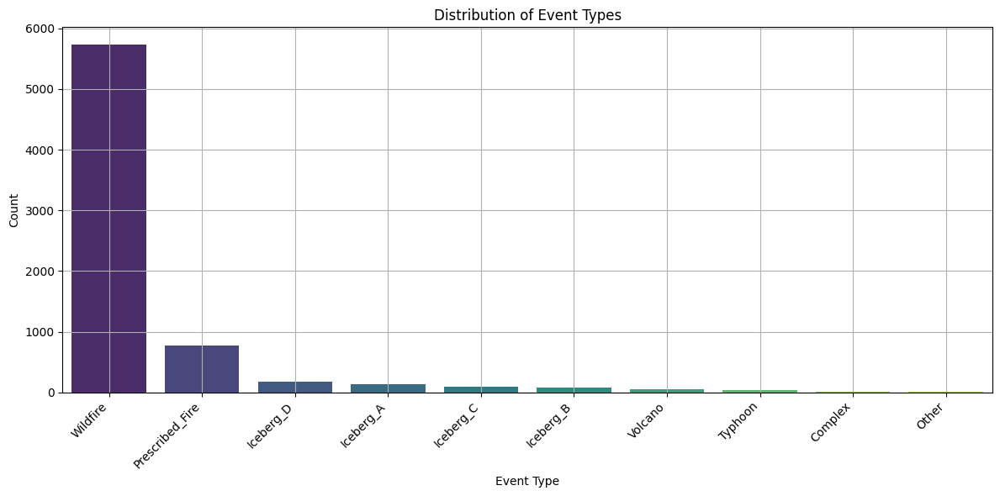

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.barplot(x=df['Event_type'].value_counts().index, y=df['Event_type'].value_counts().values, palette='viridis')
plt.title('Distribution of Event Types')
plt.xlabel('Event Type')
plt.ylabel('Count')
plt.grid()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

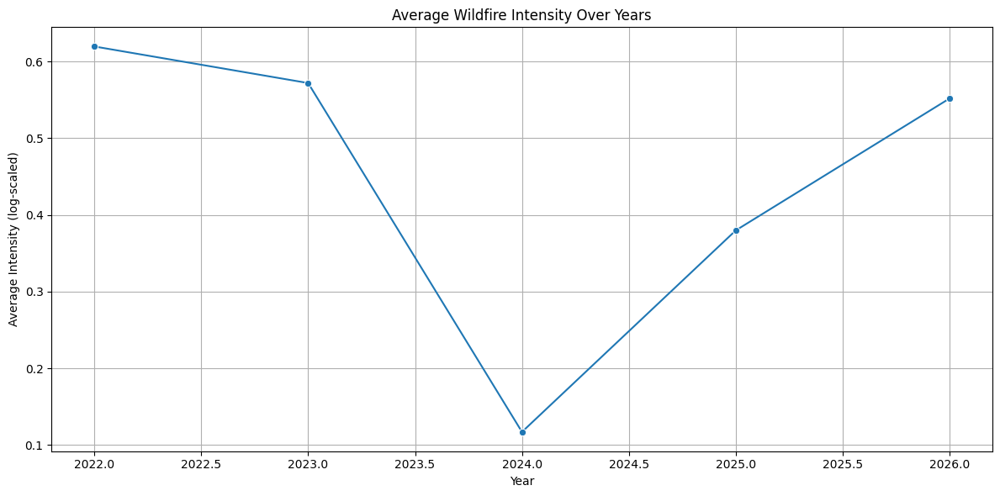

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter wildfire data
wildfire_data = df[df['Event_type'] == 'Wildfire'].copy()

# Group by year (mean intensity)
wildfire_intensity_by_year = (
    wildfire_data
    .groupby('year')['intensity']
    .mean()
    .reset_index()
    .sort_values('year')   # IMPORTANT
)

# Plot
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=wildfire_intensity_by_year,
    x='year',
    y='intensity',
    marker='o'
)

plt.title('Average Wildfire Intensity Over Years')
plt.xlabel('Year')
plt.ylabel('Average Intensity (log-scaled)')
plt.grid(True)

plt.tight_layout()
plt.show()

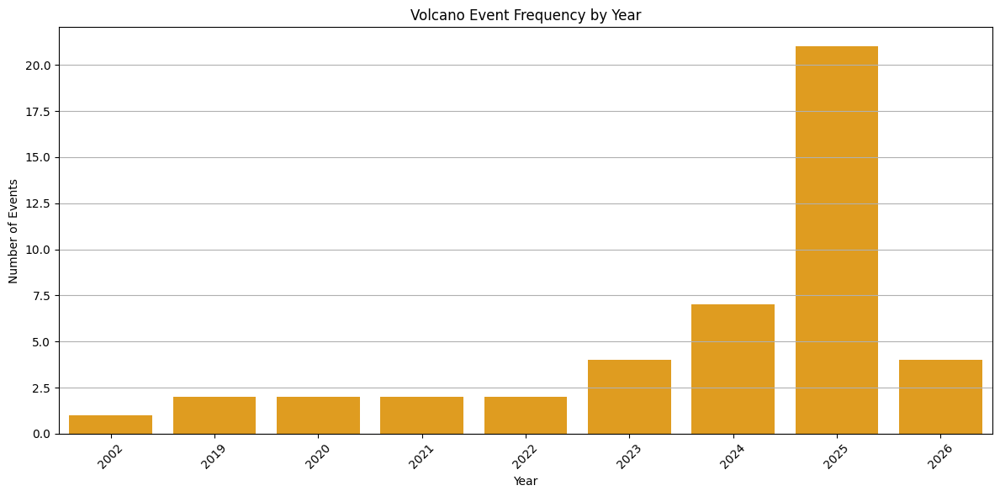

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter volcano data
volcano_data = df[df['Event_type'] == 'Volcano'].copy()

# Count events per year (clear + sorted)
volcano_count_by_year = (
    volcano_data
    .groupby('year')
    .agg(event_count=('Event_type', 'count'))
    .reset_index()
    .sort_values('year')   # IMPORTANT
)

# Plot
plt.figure(figsize=(12, 6))

sns.barplot(
    data=volcano_count_by_year,
    x='year',
    y='event_count', color='orange'
)

plt.title('Volcano Event Frequency by Year')
plt.xlabel('Year')
plt.ylabel('Number of Events')

plt.xticks(rotation=45)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [ ]:
df

,Event_type,lat,lon,magnitude,intensity,year,month,day,hour,dayofweek,is_weekend,month_sin,month_cos
0,Prescribed_Fire,45.850859,-92.653518,1490.3,0.550820,2026,4,23,14,3,0,0.866025,-0.500000
1,Wildfire,43.631000,-101.395083,1000.0,0.520729,2026,4,23,12,3,0,0.866025,-0.500000
2,Prescribed_Fire,43.882750,-85.896883,658.0,0.489176,2026,4,23,11,3,0,0.866025,-0.500000
3,Wildfire,42.124830,-99.042730,1000.0,0.520729,2026,4,23,9,3,0,0.866025,-0.500000
4,Wildfire,42.763583,-101.004000,2500.0,0.589847,2026,4,22,21,2,0,0.866025,-0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Iceberg_B,-66.366000,143.363800,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000
7087,Iceberg_B,-66.735400,142.664900,1.0,0.051568,2013,4,8,0,0,0,0.866025,-0.500000
7088,Iceberg_B,-66.370000,143.390000,1.0,0.051568,2018,1,12,0,4,0,0.500000,0.866025
7089,Iceberg_C,-64.995500,96.180000,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns


df = pd.read_csv("final_hazard_dataset.csv")


print("\nBasic stats:")
print(df.describe())


Basic stats:
               lat          lon      magnitude    intensity         year  \
count  7091.000000  7091.000000    7091.000000  7091.000000  7091.000000   
mean     10.209045   -24.535665    1415.836618     0.246333  2024.472007   
std      34.653705    88.376608   11306.486138     0.240512     0.975236   
min     -77.690000  -179.860000       0.010000     0.000000  2002.000000   
25%     -14.711598   -94.967411       1.000000     0.051568  2024.000000   
50%       9.576711   -56.440023       1.000000     0.051568  2024.000000   
75%      36.769869    28.718827     780.000000     0.501996  2025.000000   
max      70.367698   179.790000  572804.000000     1.000000  2026.000000   

             month          day         hour    dayofweek   is_weekend  \
count  7091.000000  7091.000000  7091.000000  7091.000000  7091.000000   
mean      6.382316    15.986744    15.281343     2.884643     0.221548   
std       2.989699     8.542854     6.027063     1.895791     0.415318   
min  

In [ ]:
df

,Event_type,lat,lon,magnitude,intensity,year,month,day,hour,dayofweek,is_weekend,month_sin,month_cos
0,Prescribed_Fire,45.850859,-92.653518,1490.3,0.550820,2026,4,23,14,3,0,0.866025,-0.500000
1,Wildfire,43.631000,-101.395083,1000.0,0.520729,2026,4,23,12,3,0,0.866025,-0.500000
2,Prescribed_Fire,43.882750,-85.896883,658.0,0.489176,2026,4,23,11,3,0,0.866025,-0.500000
3,Wildfire,42.124830,-99.042730,1000.0,0.520729,2026,4,23,9,3,0,0.866025,-0.500000
4,Wildfire,42.763583,-101.004000,2500.0,0.589847,2026,4,22,21,2,0,0.866025,-0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Iceberg_B,-66.366000,143.363800,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000
7087,Iceberg_B,-66.735400,142.664900,1.0,0.051568,2013,4,8,0,0,0,0.866025,-0.500000
7088,Iceberg_B,-66.370000,143.390000,1.0,0.051568,2018,1,12,0,4,0,0.500000,0.866025
7089,Iceberg_C,-64.995500,96.180000,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000


In [ ]:
from sklearn.cluster import HDBSCAN

EARTH_RADIUS_KM = 6371.0088

MIN_SAMPLES_FLOOR = 3
MIN_SAMPLES_FRAC  = 0.005   # 0.5 % of subset
MIN_SAMPLES_CAP   = 20

def _min_samples(n: int) -> int:
    return int(np.clip(
        max(MIN_SAMPLES_FLOOR, n * MIN_SAMPLES_FRAC),
        MIN_SAMPLES_FLOOR, MIN_SAMPLES_CAP
    ))

final_df['cluster'] = -1
type_offset = 0   # deterministic per-type offset — no hash collision risk

print('\nRunning HDBSCAN per Event Type...\n')

for event in sorted(final_df['Event_type'].unique()):
    mask   = final_df['Event_type'] == event
    subset = final_df[mask]
    n      = len(subset)

    if n < MIN_SAMPLES_FLOOR:
        print(f'[{event}] SKIPPED — only {n} points')
        continue

    ms     = _min_samples(n)

    coords = np.radians(subset[['lat', 'lon']].values)

    labels = HDBSCAN(
        min_cluster_size=max(5, int(n * 0.01)),  # 1% of data or at least 5
        min_samples=ms,
        metric='haversine',
        algorithm='ball_tree',
        cluster_selection_method='eom',
        n_jobs=-1,
    ).fit_predict(coords)

    # Offset positive labels; noise stays -1
    pos = labels != -1
    labels[pos] = labels[pos] + type_offset

    final_df.loc[mask, 'cluster'] = labels

    n_clusters = int(labels[pos].max() - labels[pos].min() + 1) if pos.any() else 0
    noise_pct  = round((labels == -1).sum() / n * 100, 1)
    type_offset += (n_clusters + 100)   # leave a gap between event types

    print(f'[{event}] min_cluster_size={max(5, int(n*0.01))} | min_s={ms} | n={n} | '
          f'clusters={n_clusters} | noise={noise_pct}%')

overall_noise = (final_df['cluster'] == -1).mean() * 100
print(f'\nOverall noise: {overall_noise:.1f}%  (target 20–40%)')


Running HDBSCAN per Event Type...

[Complex] min_cluster_size=5 | min_s=3 | n=11 | clusters=0 | noise=100.0%
[Iceberg_A] min_cluster_size=5 | min_s=3 | n=140 | clusters=2 | noise=0.0%
[Iceberg_B] min_cluster_size=5 | min_s=3 | n=85 | clusters=2 | noise=4.7%
[Iceberg_C] min_cluster_size=5 | min_s=3 | n=88 | clusters=2 | noise=0.0%
[Iceberg_D] min_cluster_size=5 | min_s=3 | n=173 | clusters=11 | noise=2.9%
[Other] min_cluster_size=5 | min_s=3 | n=4 | clusters=0 | noise=100.0%
[Prescribed_Fire] min_cluster_size=7 | min_s=3 | n=772 | clusters=45 | noise=13.6%
[Typhoon] min_cluster_size=5 | min_s=3 | n=41 | clusters=2 | noise=19.5%
[Volcano] min_cluster_size=5 | min_s=3 | n=45 | clusters=4 | noise=2.2%
[Wildfire] min_cluster_size=57 | min_s=20 | n=5732 | clusters=20 | noise=16.8%

Overall noise: 15.6%  (target 20–40%)


In [ ]:
final_df

,Event_type,lat,lon,magnitude,intensity,year,month,day,hour,dayofweek,is_weekend,month_sin,month_cos,cluster
0,Prescribed_Fire,45.850859,-92.653518,1490.3,0.550820,2026,4,23,14,3,0,0.866025,-0.500000,620
1,Wildfire,43.631000,-101.395083,1000.0,0.520729,2026,4,23,12,3,0,0.866025,-0.500000,980
2,Prescribed_Fire,43.882750,-85.896883,658.0,0.489176,2026,4,23,11,3,0,0.866025,-0.500000,-1
3,Wildfire,42.124830,-99.042730,1000.0,0.520729,2026,4,23,9,3,0,0.866025,-0.500000,980
4,Wildfire,42.763583,-101.004000,2500.0,0.589847,2026,4,22,21,2,0,0.866025,-0.500000,980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Iceberg_B,-66.366000,143.363800,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000,-1
7087,Iceberg_B,-66.735400,142.664900,1.0,0.051568,2013,4,8,0,0,0,0.866025,-0.500000,-1
7088,Iceberg_B,-66.370000,143.390000,1.0,0.051568,2018,1,12,0,4,0,0.500000,0.866025,-1
7089,Iceberg_C,-64.995500,96.180000,1.0,0.051568,2011,8,30,0,1,0,-0.866025,-0.500000,304


In [ ]:
final_df.to_csv("final_hazard_dataset_with_clusters.csv", index=False)
print("\nClustered dataset saved as 'final_hazard_dataset_with_clusters.csv'") # save the clusterd data


Clustered dataset saved as 'final_hazard_dataset_with_clusters.csv'


In [ ]:
# CELL 3 — Temporal analysis per cluster
# ============================================================
clustered_df = final_df[final_df['cluster'] != -1].copy()

cluster_time = (
    clustered_df
    .groupby(['cluster', 'year'])
    .size()
    .reset_index(name='event_count')
)

cluster_time['growth'] = (
    cluster_time
    .groupby('cluster')['event_count']
    .diff()
    .fillna(0)
)

cluster_trend_summary = (
    cluster_time
    .groupby('cluster')
    .agg(
        avg_events    = ('event_count', 'mean'),
        max_events    = ('event_count', 'max'),
        avg_growth    = ('growth',      'mean'),
        recent_growth = ('growth',      'last'),
    )
    .reset_index()
)

print('\n=== TEMPORAL CLUSTER ANALYSIS ===')
print(cluster_trend_summary.head(10).to_string(index=False))




=== TEMPORAL CLUSTER ANALYSIS ===
 cluster  avg_events  max_events  avg_growth  recent_growth
     100   20.500000          68    1.000000          -54.0
     101    8.500000          12   -3.500000           -7.0
     202   22.000000          52    2.000000          -42.0
     203    3.750000           9    0.750000           -5.0
     304    8.888889          35    1.444444          -21.0
     305    1.333333           3    0.000000            0.0
     406    1.250000           2   -0.250000            0.0
     407    4.250000           9    0.750000           -5.0
     408    7.666667          18    1.000000          -14.0
     409    8.000000          20    0.000000          -18.0


In [ ]:

# ============================================================
# CELL 4 — Clustering summary by event type
# ============================================================
summary_rows = []

for event in sorted(final_df['Event_type'].unique()):
    subset   = final_df[final_df['Event_type'] == event]
    clusters = subset['cluster']
    n        = len(subset)

    n_clusters  = subset[subset['cluster'] != -1]['cluster'].nunique()
    noise_count = (clusters == -1).sum()
    noise_pct   = noise_count / n * 100

    # Noise thresholds aligned with Model_train.py
    if noise_pct < 20:
        structure = 'Highly Structured'
    elif noise_pct < 40:
        structure = 'Moderately Structured'
    elif noise_pct < 60:
        structure = 'Weakly Structured'
    else:
        structure = 'Scattered / Sparse'

    summary_rows.append({
        'Event_type':   event,
        'num_events':   n,
        'num_clusters': n_clusters,
        'noise_%':      round(noise_pct, 2),
        'structure':    structure,
    })

    print(f'[{event}]')
    print(f'   Clusters : {n_clusters}')
    print(f'   Noise    : {noise_count} ({noise_pct:.1f}%)')
    print(f'   Pattern  : {structure}\n')

event_summary = pd.DataFrame(summary_rows)
print('\n=== Structured Summary Table ===')
print(event_summary.to_string(index=False))


[Complex]
   Clusters : 0
   Noise    : 11 (100.0%)
   Pattern  : Scattered / Sparse

[Iceberg_A]
   Clusters : 2
   Noise    : 0 (0.0%)
   Pattern  : Highly Structured

[Iceberg_B]
   Clusters : 2
   Noise    : 4 (4.7%)
   Pattern  : Highly Structured

[Iceberg_C]
   Clusters : 2
   Noise    : 0 (0.0%)
   Pattern  : Highly Structured

[Iceberg_D]
   Clusters : 11
   Noise    : 5 (2.9%)
   Pattern  : Highly Structured

[Other]
   Clusters : 0
   Noise    : 4 (100.0%)
   Pattern  : Scattered / Sparse

[Prescribed_Fire]
   Clusters : 60
   Noise    : 89 (11.5%)
   Pattern  : Highly Structured

[Typhoon]
   Clusters : 2
   Noise    : 8 (19.5%)
   Pattern  : Highly Structured

[Volcano]
   Clusters : 4
   Noise    : 1 (2.2%)
   Pattern  : Highly Structured

[Wildfire]
   Clusters : 43
   Noise    : 1225 (21.4%)
   Pattern  : Moderately Structured


=== Structured Summary Table ===
     Event_type  num_events  num_clusters  noise_%             structure
        Complex          11          

In [ ]:

# ============================================================
# CELL 5 — Advanced cluster analysis + normalised risk score
# ============================================================
def _safe_normalise(series: pd.Series) -> pd.Series:
    lo, hi = series.min(), series.max()
    if hi > lo:
        return (series - lo) / (hi - lo)
    return pd.Series(np.zeros(len(series), dtype=float), index=series.index)

cluster_summary = (
    final_df[final_df['cluster'] != -1]
    .groupby(['Event_type', 'cluster'])
    .agg(
        num_events    = ('Event_type', 'count'),
        avg_intensity = ('intensity',  'mean'),
        avg_lat       = ('lat',        'mean'),
        avg_lon       = ('lon',        'mean'),
        start_year    = ('year',       'min'),
        end_year      = ('year',       'max'),
    )
    .reset_index()
)

# Dominant event type per cluster
dominant = (
    final_df[final_df['cluster'] != -1]
    .groupby('cluster')['Event_type']
    .agg(lambda s: s.mode().iloc[0])
    .reset_index()
    .rename(columns={'Event_type': 'dominant_event_type'})
)
cluster_summary = cluster_summary.merge(dominant, on='cluster', how='left')

cluster_summary['active_years']    = (cluster_summary['end_year'] - cluster_summary['start_year'] + 1).clip(lower=1)
cluster_summary['events_per_year'] = cluster_summary['num_events'] / cluster_summary['active_years']

# Recent activity (last 2 years)
recent_cutoff  = int(final_df['year'].max()) - 1
recent_counts  = (
    final_df[(final_df['cluster'] != -1) & (final_df['year'] >= recent_cutoff)]
    .groupby('cluster')
    .size()
    .reset_index(name='recent_events')
)
cluster_summary = cluster_summary.merge(recent_counts, on='cluster', how='left')
cluster_summary['recent_events'] = cluster_summary['recent_events'].fillna(0)

# Growth factor (capped at 5×)
cluster_summary['growth_factor'] = (
    cluster_summary['recent_events'] / cluster_summary['events_per_year']
).replace([np.inf, -np.inf], 0).fillna(0).clip(upper=5.0)

# Recency ratio
cluster_summary['recency_ratio'] = (
    cluster_summary['recent_events'] / cluster_summary['num_events']
).clip(0, 1).fillna(0)

# Fully normalised 4-component risk score → [0, 100]
# A: recency surge  B: growth acceleration  C: persistence  D: intensity
comp_A = cluster_summary['recency_ratio']
comp_B = _safe_normalise(cluster_summary['growth_factor'])
comp_C = _safe_normalise(np.log1p(cluster_summary['events_per_year']))
comp_D = _safe_normalise(cluster_summary['avg_intensity'])

cluster_summary['risk_score'] = ((comp_A + comp_B + comp_C + comp_D) / 4 * 100).round(2)

# Risk level
if len(cluster_summary) >= 3:
    try:
        cluster_summary['risk_level'] = pd.qcut(
            cluster_summary['risk_score'],
            q=3, labels=['Low', 'Medium', 'High'], duplicates='drop'
        )
    except ValueError:
        cluster_summary['risk_level'] = 'Medium'
else:
    cluster_summary['risk_level'] = 'Medium'

cluster_summary = cluster_summary.sort_values('risk_score', ascending=False).reset_index(drop=True)

print('\n=== ADVANCED CLUSTER SUMMARY (Ranked) ===')
print(cluster_summary[[
    'cluster', 'dominant_event_type', 'num_events',
    'recent_events', 'growth_factor', 'risk_score', 'risk_level'
]].head(15).to_string(index=False))




=== ADVANCED CLUSTER SUMMARY (Ranked) ===
 cluster dominant_event_type  num_events  recent_events  growth_factor  risk_score risk_level
    1024            Wildfire         233          218.0       2.806867       76.17       High
    1025            Wildfire          96           87.0       2.718750       70.78       High
     670     Prescribed_Fire          89           89.0       1.000000       70.14       High
     202           Iceberg_B          66           62.0       2.818182       65.95       High
     626     Prescribed_Fire          12           12.0       2.000000       65.61       High
     668     Prescribed_Fire          22           22.0       2.000000       65.47       High
    1020            Wildfire          25           22.0       2.640000       65.29       High
     660     Prescribed_Fire          16           16.0       2.000000       64.56       High
     661     Prescribed_Fire          12           12.0       2.000000       64.31       High
     622     Pres

In [ ]:

cluster_summary['time_risk_score'] = (
    cluster_summary['risk_score'] * (1 + cluster_summary['growth_factor'])
)

threshold = cluster_summary['risk_score'].quantile(0.75)
high_risk = cluster_summary[cluster_summary['risk_score'] >= threshold].copy().reset_index(drop=True)

output_cols = [
    'cluster', 'dominant_event_type', 'Event_type',
    'avg_lat', 'avg_lon', 'num_events', 'recent_events',
    'events_per_year', 'growth_factor', 'recency_ratio',
    'risk_score', 'time_risk_score', 'risk_level',
    'start_year', 'end_year', 'active_years',
]
high_risk = high_risk[[c for c in output_cols if c in high_risk.columns]]

print('\n=== HIGH-RISK REGIONS (Top 25%) ===')
print(high_risk[[
    'cluster', 'dominant_event_type', 'num_events',
    'recent_events', 'risk_score', 'time_risk_score', 'risk_level'
]].to_string(index=False))




=== HIGH-RISK REGIONS (Top 25%) ===
 cluster dominant_event_type  num_events  recent_events  risk_score  time_risk_score risk_level
    1024            Wildfire         233          218.0       76.17       289.969056       High
    1025            Wildfire          96           87.0       70.78       263.213125       High
     670     Prescribed_Fire          89           89.0       70.14       140.280000       High
     202           Iceberg_B          66           62.0       65.95       251.809091       High
     626     Prescribed_Fire          12           12.0       65.61       196.830000       High
     668     Prescribed_Fire          22           22.0       65.47       196.410000       High
    1020            Wildfire          25           22.0       65.29       237.655600       High
     660     Prescribed_Fire          16           16.0       64.56       193.680000       High
     661     Prescribed_Fire          12           12.0       64.31       192.930000       High
   

In [ ]:
high_risk.to_csv("High_risk_regions.csv", index=False)

In [ ]:
centroids = high_risk[['cluster', 'avg_lat', 'avg_lon', 'time_risk_score', 'Event_type']]

fig = px.scatter_geo(
    centroids,
    lat='avg_lat',
    lon='avg_lon',
    color='Event_type',
    size='time_risk_score',
    hover_data=['cluster', 'time_risk_score'],
    title='🔥 High-Risk Regions (Centroid View)',
    projection='natural earth'
)

fig.show()

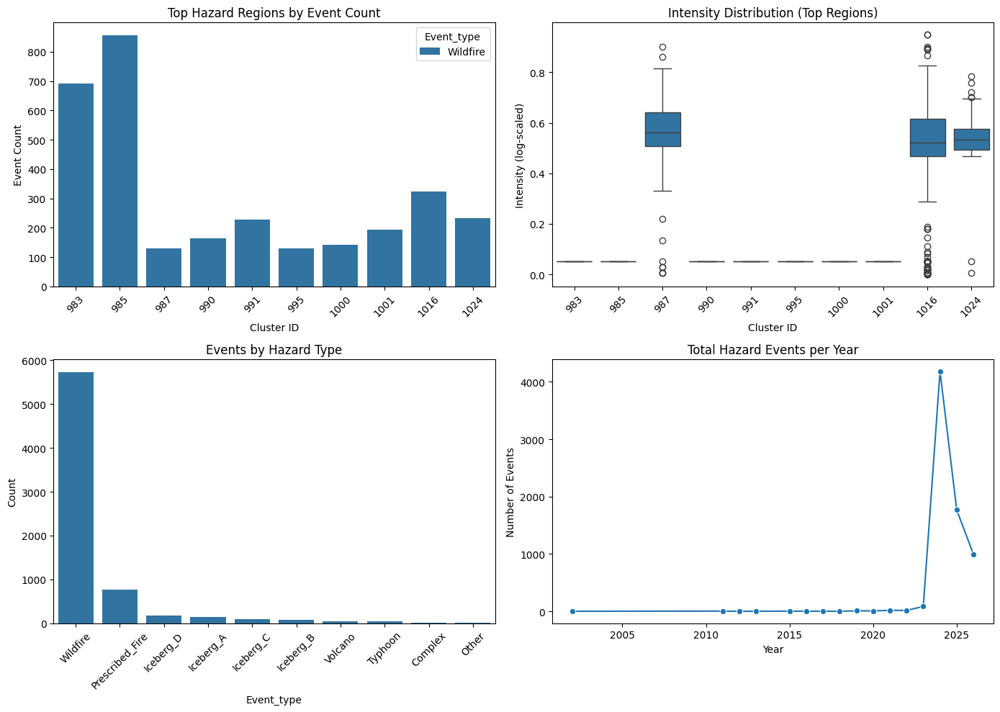

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 10))

# ========================
# Graph 1: Top regions by event count
# ========================
plt.subplot(2, 2, 1)

top_clusters = (
    cluster_summary
    .sort_values(by='num_events', ascending=False)
    .head(10)   # limit for readability
)

sns.barplot(
    data=top_clusters,
    x='cluster',
    y='num_events',
    hue='Event_type'
)

plt.title('Top Hazard Regions by Event Count')
plt.xlabel('Cluster ID')
plt.ylabel('Event Count')
plt.xticks(rotation=45)

# ========================
# Graph 2: Intensity distribution by region
# ========================
plt.subplot(2, 2, 2)

subset = final_df[final_df['cluster'] != -1].copy()

# limit to top clusters for clarity
top_ids = top_clusters['cluster'].unique()
subset = subset[subset['cluster'].isin(top_ids)]

sns.boxplot(
    data=subset,
    x='cluster',
    y='intensity'
)

plt.title('Intensity Distribution (Top Regions)')
plt.xlabel('Cluster ID')
plt.ylabel('Intensity (log-scaled)')
plt.xticks(rotation=45)

# ========================
# Graph 3: Events by type
# ========================
plt.subplot(2, 2, 3)

sns.countplot(
    data=df,
    x='Event_type',
    order=df['Event_type'].value_counts().index
)

plt.title('Events by Hazard Type')
plt.ylabel('Count')
plt.xticks(rotation=45)

# ========================
# Graph 4: Events per year
# ========================
plt.subplot(2, 2, 4)

yearly = df.groupby('year').size().reset_index(name='count')

sns.lineplot(data=yearly, x='year', y='count', marker='o')

plt.title('Total Hazard Events per Year')
plt.xlabel('Year')
plt.ylabel('Number of Events')

plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

# Remove noise for clarity
map_df = final_df[final_df['cluster'] != -1].copy()

fig1 = px.scatter_geo(
    map_df,
    lat='lat',
    lon='lon',
    color=map_df['cluster'].astype(str),   # treat cluster as categorical
    hover_name='Event_type',
    hover_data={
        'intensity': True,
        'year': True,
        'month': True,
        'day': True,
        'cluster': True
    },
    title='Hazard Regions Discovered by HDBSCAN',
    labels={'color': 'Region ID'},
    projection='natural earth',
    size='intensity',          # use intensity instead of magnitude
    size_max=12
)

# cleaner markers
fig1.update_traces(marker=dict(opacity=0.7))

fig1.show()

In [ ]:
import plotly.express as px

# Remove noise
df_clean = final_df[final_df['cluster'] != -1].copy()

fig2 = px.scatter_geo(
    df_clean,
    lat='lat',
    lon='lon',
    color=df_clean['cluster'].astype(str),   # treat cluster as categorical
    hover_name='Event_type',
    hover_data={
        'intensity': True,   # use intensity instead of magnitude
        'year': True,
        'cluster': True
    },
    title='Clustered Hazard Regions (Noise Removed)',
    projection='natural earth',
    size='intensity',        # size reflects severity
    size_max=10
)

# Improve visibility
fig2.update_traces(marker=dict(opacity=0.7))

fig2.show()

In [ ]:
import plotly.express as px

fig3 = px.scatter_geo(
    final_df,
    lat='lat',
    lon='lon',
    color='Event_type',
    hover_name='Event_type',
    hover_data={
        'intensity': True,
        'year': True,
        'cluster': True   # useful for comparison with clustering
    },
    title='All Hazard Events by Type (Baseline View)',
    projection='natural earth',
    size='intensity',     # adds severity context
    size_max=5
)

fig3.update_traces(marker=dict(opacity=0.6))

fig3.show()

In [ ]:
from sklearn.metrics.pairwise import haversine_distances
import numpy as np

def predict_region(new_lat: float, new_lon: float, df, eps_km: float = 200):

    clustered_df = df[df['cluster'] != -1].copy()

    if clustered_df.empty:
        return "No clusters available."

    # Compute centroids
    centroids = (
        clustered_df
        .groupby('cluster')[['lat', 'lon']]
        .mean()
        .reset_index()
    )

    new_point = np.radians([[new_lat, new_lon]])
    centroid_coords = np.radians(centroids[['lat', 'lon']].values)

    distances = haversine_distances(new_point, centroid_coords) * 6371.0

    min_dist = distances.min()
    nearest_idx = distances.argmin()
    nearest_cluster = int(centroids.iloc[nearest_idx]['cluster'])

    if min_dist <= eps_km:
        subset = clustered_df[clustered_df['cluster'] == nearest_cluster]
        event_type = subset['Event_type'].mode()[0]

        return (
            f"→ Assigned to Region {nearest_cluster} ({event_type})\n"
            f"   Distance: {min_dist:.1f} km"
        )
    else:
        return (
            f"→ NEW / Noise Event\n"
            f"   Closest region: {nearest_cluster} ({min_dist:.1f} km away)"
        )

In [ ]:
result = predict_region(36.5, -120.5, df)
print(result)

→ NEW / Noise Event
   Closest region: 632 (622.9 km away)


In [ ]:
# ============================================================
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

print('\n' + '=' * 55)
print('  MODEL EVALUATION')
print('=' * 55)

clustered_eval = final_df[final_df['cluster'] != -1].copy()
coords_all     = clustered_eval[['lat', 'lon']].values
labels_all     = clustered_eval['cluster'].values

n_clusters_total = len(set(labels_all))
n_noise          = (final_df['cluster'] == -1).sum()
noise_pct_total  = n_noise / len(final_df) * 100

print(f'\nTotal clusters found   : {n_clusters_total}')
print(f'Noise points           : {n_noise} ({noise_pct_total:.1f}%)')
print(f'Clustered points       : {len(clustered_eval)} ({100 - noise_pct_total:.1f}%)')

# Geometric cluster quality metrics (computed on lat/lon — fast, no Haversine needed here)
if n_clusters_total >= 2 and len(clustered_eval) > n_clusters_total:
    sil  = silhouette_score(coords_all, labels_all, sample_size=min(10_000, len(clustered_eval)), random_state=42)
    db   = davies_bouldin_score(coords_all, labels_all)
    ch   = calinski_harabasz_score(coords_all, labels_all)
    print(f'\nSilhouette score       : {sil:.4f}   (closer to +1 = better separated)')
    print(f'Davies–Bouldin index   : {db:.4f}   (lower = better)')
    print(f'Calinski–Harabasz idx  : {ch:.2f}  (higher = better)')
else:
    print('\nNot enough clusters for geometric metrics.')

# Per-event-type noise audit
print('\n--- Per-event-type noise audit ---')
for event in sorted(final_df['Event_type'].unique()):
    sub   = final_df[final_df['Event_type'] == event]
    noise = (sub['cluster'] == -1).mean() * 100
    flag  = '⚠ high' if noise > 60 else ('✓ ok' if noise <= 40 else '~ moderate')
    print(f'  {event:<20} noise={noise:5.1f}%  {flag}')

# Risk score distribution
print('\n--- Risk score distribution ---')
print(cluster_summary['risk_score'].describe().round(2).to_string())

print('\n--- Risk level counts ---')
print(cluster_summary['risk_level'].value_counts().to_string())

# High-risk cluster coverage
high_risk_events = high_risk['num_events'].sum()
total_events     = len(final_df[final_df['cluster'] != -1])
print(f'\nHigh-risk clusters     : {len(high_risk)}')
print(f'Events in high-risk    : {high_risk_events} ({high_risk_events / total_events * 100:.1f}% of clustered)')
print(f'Avg risk score (high)  : {high_risk["risk_score"].mean():.2f}')
print(f'Avg growth factor      : {high_risk["growth_factor"].mean():.2f}')

# Noise target check
print(f'\n--- Noise target check (20–40%) ---')
if 20 <= noise_pct_total <= 40:
    print(f'✓ Noise {noise_pct_total:.1f}% is within target range.')
elif noise_pct_total < 20:
    print(f'⚠ Noise {noise_pct_total:.1f}% is LOW — consider reducing eps or min_samples.')
else:
    print(f'⚠ Noise {noise_pct_total:.1f}% is HIGH — consider increasing eps or reducing min_samples.')



  MODEL EVALUATION

Total clusters found   : 88
Noise points           : 1103 (15.6%)
Clustered points       : 5988 (84.4%)

Silhouette score       : 0.4257   (closer to +1 = better separated)
Davies–Bouldin index   : 2.1473   (lower = better)
Calinski–Harabasz idx  : 5410.86  (higher = better)

--- Per-event-type noise audit ---
  Complex              noise=100.0%  ⚠ high
  Iceberg_A            noise=  0.0%  ✓ ok
  Iceberg_B            noise=  4.7%  ✓ ok
  Iceberg_C            noise=  0.0%  ✓ ok
  Iceberg_D            noise=  2.9%  ✓ ok
  Other                noise=100.0%  ⚠ high
  Prescribed_Fire      noise= 13.6%  ✓ ok
  Typhoon              noise= 19.5%  ✓ ok
  Volcano              noise=  2.2%  ✓ ok
  Wildfire             noise= 16.8%  ✓ ok

--- Risk score distribution ---
count    126.00
mean      47.89
std       18.41
min        6.23
25%       31.70
50%       57.88
75%       61.06
max       76.17

--- Risk level counts ---
risk_level
Low       42
Medium    42
High      42

High